# List of lightweight time series forcast models

- LSTM
- GRU
- MLP
- ARIMA
- SARIMA
- Decision Trees
- Random Forest


- Hybrid models 


### getting data


In [1]:
# make new Mongo Data collection for data only from the p1 sensors in acceptance
# use fields.json to convert into the real name for better documentation during training

from pymongo import MongoClient

client = MongoClient("mongodb://localhost:27017/", compressors='zlib')
db = client["HBI_datalake"]

data_energy = db["energy_data"]
devices = db["devices"]


########### ACCESS KEYS HAVE BEEN REDACTED ###################

BUCKET_NAME = f"datalake-{type}-eu-west-1"

In [2]:
# put all data in mongoDB collection`

import boto3
import os
import json, ijson
import time

from decimal import Decimal
from datetime import datetime


def isRepeat(obj):
    times = []
    if 'metadata' in obj:
        if obj["metadata"]["time"] in times:
            return True
        
        times.append(obj["metadata"]["time"])
    return False

def changeTimeFormat(doc):
    try:
        if "metadata" in doc: #

            if doc["metadata"]["time"] is None:
                return

            if not isinstance(doc["metadata"]["time"], datetime):
                time = doc["metadata"]["time"] # adds the 0's missing
                if 'Z' in time:
                    time = time[:-1] # remove the Z
                    if len(time) < 27-1:
                        time = time + "0"*(27-len(doc["metadata"]["time"])) 
                            # add as many zeors as the difference between the length its supposed ot be
                            # and the length it actually is now
                    elif len(time) > 27-1:
                        time = time[:27-len(doc["metadata"]["time"])] # cut off the extra 0's so its length is 26 + 'Z' again
                        # changing the format and adding the Z for it to be used
                    newTime = datetime.strptime(time + "Z", "%Y-%m-%dT%H:%M:%S.%fZ") # error caused by  0's on the right missing
                    doc["metadata"]["time"] = newTime
                else:
                    newTime = datetime.strptime(time, "%Y-%m-%dT%H:%M:%S%z")

                doc["metadata"]["time"] = newTime
        else: # event types action and command do not have metadata, they use "created_at" which has a different format :/
            newTime = datetime.strptime(doc["created_at"][:-6], "%Y-%m-%dT%H:%M:%S.%f")
            # datetime is by default UTC which is Z so theres no need to add it here
            doc["created_at"] = newTime
    except Exception as e:
        print(f"error on {doc['metadata']['time']}:\n{e}")

def checkForDecimal(obj):
    # when you see a list go thru every element and check if its decimal, then change
    # whenever you see a dictionary inside anything you recurse
    if isinstance(obj, dict):
        for key in obj:
            if isinstance(obj[key], Decimal):
                obj[key] = float(obj[key])
            elif isinstance(obj[key], list):
                for x in range(len(obj[key])):
                    if isinstance(obj[key][x], Decimal):
                        obj[key][x] = float(obj[key][x])
                    elif isinstance(obj[key][x], dict):
                        checkForDecimal(obj[key][x])
            elif isinstance(obj[key], dict):
                checkForDecimal(obj[key])

    elif isinstance(obj, Decimal):
        obj = float(obj)


def storeFile(dataFile):   
    with open(dataFile, "r") as file:
        jsonF = ijson.items(file, 'item')   
        for obj in jsonF:   
            #if not isRepeat(obj):
                # exhaustively check all fields to check if theres a single decimal
            checkForDecimal(obj) # Decimal type breaks db, so repalced by float
                #changeTimeFormat(obj) # time as string doesnt allow for good searches, so replaced by datetime (from micro-s to micro-s)

            #data.insert_one(obj)  


# stores all json files inside a directory
def storeDirectory(directoryPath:str):
    for filename in os.listdir(directoryPath):
        if filename.endswith(".json"):
            storeFile(f"{directoryPath}/{filename}")
            



sts_client0 = boto3.client('sts',
    aws_access_key_id = AWS_KEY,
    aws_secret_access_key = AWS_SECRET
)
# Call the assume_role method of the STSConnection object and pass the role
# ARN and a role session name.
assumed_role_object0=sts_client0.assume_role( #jumping to account and gettinf credentials
    RoleArn=f"arn:aws:iam::{type}:role/external-developer-role-eu-west-1",
    RoleSessionName="AssumeRoleSession1"
)

# From the response that contains the assumed role, get the temporary 
# credentials that can be used to make subsequent API calls
credentials0=assumed_role_object0['Credentials']

client = boto3.client("s3",
    aws_access_key_id=credentials0['AccessKeyId'],
    aws_secret_access_key=credentials0['SecretAccessKey'],
    aws_session_token=credentials0['SessionToken'],
)

# grabbing latest folder of data so extract
paginator = client.get_paginator('list_objects_v2')

folder = ""
for result in paginator.paginate(Bucket=BUCKET_NAME, Delimiter='/'):
    for prefix in result.get('CommonPrefixes'):
        folder = prefix["Prefix"][:-1]

print(folder)

2024-08-12T00:00:00____2024-08-18T23:59:59.999999


In [3]:


########### to process info inside folders
def process_folder_contents(client, bucket_name, folder):
    paginator = client.get_paginator('list_objects_v2')

    while True:

        for result in paginator.paginate(Bucket=bucket_name, Prefix=folder):
            for obj in result.get('Contents', []):
                key = obj['Key']
                if key.endswith('/'):  # dont enter folders
                    continue

                response = client.get_object(Bucket=bucket_name, Key=key)
                data = json.loads(response['Body'].read().decode())

                # call func to save data
                for obj in data:
                    if not isRepeat(obj) and "metadata" in obj and "time" in obj["metadata"] and obj["metadata"]["time"] != None and "app_id" in obj and obj["app_id"] == "sqacc-p1-sensor":
                        if "dev_id" not in obj:
                            continue

                        #print(obj)

                        #relevant_data1, relevant_data2 = relevant_fields(obj["dev_id"], missed_ids)
                    
                        checkForDecimal(obj) 
                        changeTimeFormat(obj)
    
    
                        data_energy.insert_one(obj)


        # if theres no next, stop
        if 'NextContinuationToken' not in result:
            break


    
s = time.time()
i = 0
b = True

# 2023-03-27T00:00:00____2023-04-02T23:59:59.999999
left_at = "2024-02-05T00:00:00____2024-02-11T23:59:59.999999" 

paginator = client.get_paginator('list_objects_v2')

for result in paginator.paginate(Bucket=BUCKET_NAME, Delimiter='/'):
    break

    for prefix in result.get('CommonPrefixes'):

        folder = prefix.get('Prefix')[:-1]
        i += 1

        # mechanism for when it stops midway thru
        if folder == left_at or left_at == None:
            b = False
        if folder != left_at and b: 
            continue
        if folder == None: # CHANGE TO EQUAL TO MAKE IT RUN TILL END
            break


        print(f'folder: {folder} --- count: {i}')

        t = time.time()

        process_folder_contents(client, BUCKET_NAME, folder)

        execTime = time.time() - t
        print(f"took {time.time() - t} s")


print(f"\n\ntook {time.time() - s} s to execute")





took 0.2636983394622803 s to execute


### Prepearing data

In [5]:
import numpy as np
import pandas as pd
from datetime import datetime
import pymongo

field = 'E_DT2'

collection = db['energy_data']
data = pd.DataFrame(list(collection.find()))

# extracting fields to train on
data['time'] = [doc['metadata']['time'] if 'time' in doc['metadata'] else None for doc in data.to_dict(orient='records')]

# all relevant fields to train on
data['energy_consumption'] = [float(doc['payload_fields'][field]) if field in doc['payload_fields'] else None for doc in data.to_dict(orient='records')]


# eliminate uneccesary columns and empty datafields
data = data[data['energy_consumption'].notna()]
data = data[data['time'].notna()]

columns_to_keep = ['energy_consumption', 'device_id', 'time']
data = data[columns_to_keep]

# show changes in data
mean_energy_consumption = data['energy_consumption'].mean()
std_dev_energy_consumption = data['energy_consumption'].std()

print(f"Average Energy Consumption: {mean_energy_consumption}")
print(f"Standard Deviation of Energy Consumption: {std_dev_energy_consumption}")


data.head()

Average Energy Consumption: 92964.9485575379
Standard Deviation of Energy Consumption: 50678.54388146121


,energy_consumption,device_id,time
53,117044.087,f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-...,2023-04-02 10:55:15.732
55,117044.087,f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-...,2023-04-02 10:35:11.734
57,117044.087,f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-...,2023-04-02 10:15:09.737
59,117044.087,f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-...,2023-04-02 09:55:07.060
61,117044.087,f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-...,2023-04-02 09:35:05.121


In [6]:
# saving data in files
dev_ids = data['device_id'].unique()


for dev_id in dev_ids:
    dev_data = data[data['device_id'] == dev_id] # get data from each device only
    dev_data = dev_data.sort_values(by='time') # sort by date
    dev_data = dev_data.drop(columns=['device_id']) # we dont need the device_id here

    if len(dev_data) < 24: # only save files with a meaningfull enough amount of data, otherwise its just noice
        continue

    # save to train on
    file_path = os.path.join("data", f"{dev_id}.csv")
    dev_data.to_csv(file_path, index=False)
    print(f"device data saved to: {file_path}")

device data saved to: data\f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-b231-4427-8ae6-79d76a72b383#833ed7e1-d4b6-47df-b008-c4a619de6831#caf3eaf5-bab9-47f3-b5e1-cf1a4ef70591.csv
device data saved to: data\f50c5577-da7e-412e-8998-ed381aec7966#9b3ca452-42b7-4356-98a6-69b1e31a1a06#0578a70e-be19-4a84-ad3f-dac7909ff9a9#ead744e3-f2fe-436f-8b03-caae2fbc19a8.csv


In [6]:
import pandas as pd
import os

# Define the directory containing the CSV files
data_directory = "data"

# Loop through all files in the specified directory
for filename in os.listdir(data_directory):
    if filename.endswith('.csv'):
        # Construct the full file path
        file_path = os.path.join(data_directory, filename)
        
        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)
        
        # Create a new column for differences
        df['energy_consumption_diff'] = df['energy_consumption'].diff()
        
        # Fill the first value with the original value
        df['energy_consumption_diff'].fillna(df['energy_consumption'], inplace=True)
        
        # Filter out rows where the absolute difference is greater than 500
        df = df[abs(df['energy_consumption_diff']) <= 500]
        
        # Save the modified DataFrame back to a new CSV file or overwrite the existing file
        modified_file_path = os.path.join(data_directory, 'filtered_' + filename)
        df.to_csv(modified_file_path, index=False)
        print(f'Differences saved to {modified_file_path}')

        # Optionally, delete the original unmodified file
        os.remove(file_path)
        print(f'Original file {filename} deleted.')

Differences saved to data\filtered_filtered_f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-b231-4427-8ae6-79d76a72b383#833ed7e1-d4b6-47df-b008-c4a619de6831#caf3eaf5-bab9-47f3-b5e1-cf1a4ef70591.csv
Original file filtered_f50c5577-da7e-412e-8998-ed381aec7966#bf533e35-b231-4427-8ae6-79d76a72b383#833ed7e1-d4b6-47df-b008-c4a619de6831#caf3eaf5-bab9-47f3-b5e1-cf1a4ef70591.csv deleted.


### Training loop

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To ca

ARIMA Model Training RMSE: 11.229
ARIMA Model Testing RMSE: 1490137884344487646892729489066710532096.000


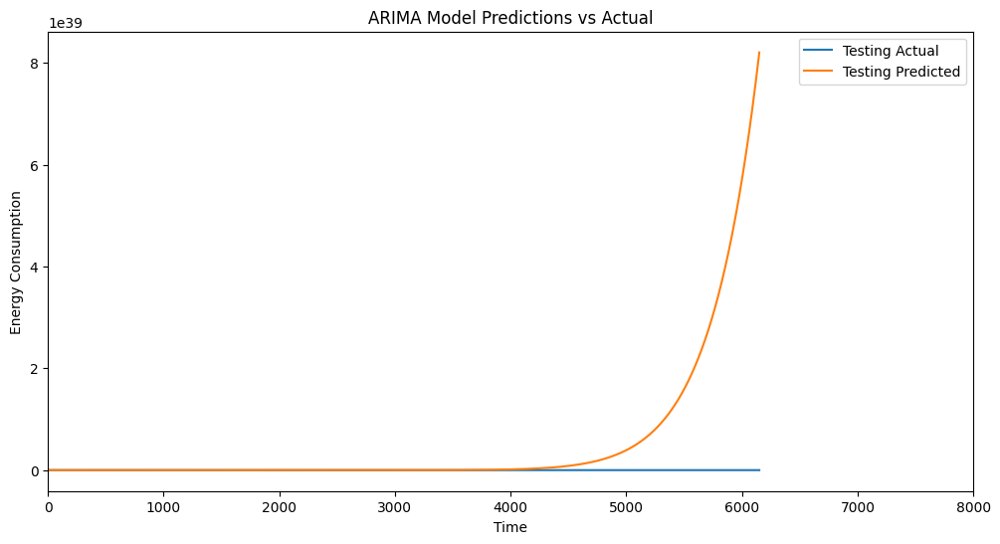

In [7]:
# ARIMA

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import pickle


data_dir = 'data/'
output_dir = 'models/ARIMA/'

os.makedirs(output_dir, exist_ok=True)


dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values


scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

y = X_scaled.flatten()

train_size = int(len(y) * 0.7)
y_train, y_test = y[:train_size], y[train_size:]

# Build and train the ARIMA model
# order=(p, d, q)
# p: The number of lag observations included in the model (autoregressive part).
# d: The number of times that the raw observations are differenced (integrated part).
# q: The size of the moving average window (moving average part).
model = ARIMA(y_train, order=(15, 15, 6))  # (p, d, q) parameters
model_fit = model.fit()

train_predictions = model_fit.predict(start=0, end=len(y_train)-1, typ='levels')
test_predictions = model_fit.forecast(steps=len(y_test))

train_predictions = scaler.inverse_transform(train_predictions.reshape(-1, 1))
test_predictions = scaler.inverse_transform(test_predictions.reshape(-1, 1))
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'ARIMA Model Training RMSE: {train_rmse:.3f}')

test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'ARIMA Model Testing RMSE: {test_rmse:.3f}')

with open(os.path.join(output_dir, 'arima_model_performance.txt'), 'w') as f:
    f.write(f'ARIMA Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'ARIMA Model Testing RMSE: {test_rmse:.3f}\n')

model_filename = os.path.join(output_dir, 'ARIMA_model.pkl')
with open(model_filename, 'wb') as model_file:
    pickle.dump(model_fit, model_file)


fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions, label='Testing Predicted')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('ARIMA Model Predictions vs Actual')

start_index = 0 
end_index = 8000

ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'arima_model_predictions_interval.png'))

plt.show()

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


SARIMA Model Training RMSE: 0.515
SARIMA Model Testing RMSE: 3302443.501


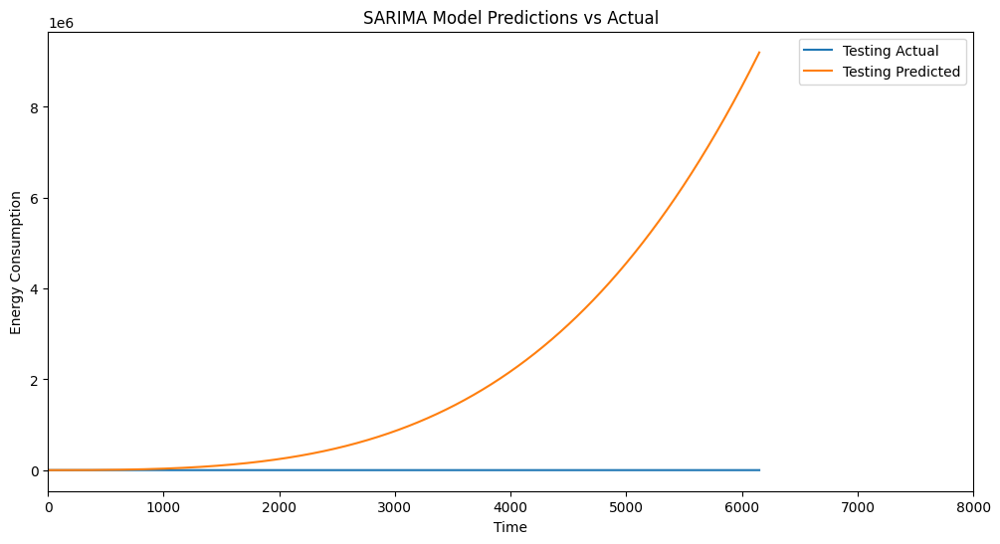

In [8]:
# SARIMA

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pickle


data_dir = 'data/'
output_dir = 'models/SARIMA/'

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values


scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

y = X_scaled.flatten()

train_size = int(len(y) * 0.7)
y_train, y_test = y[:train_size], y[train_size:]

# Build and train the SARIMA model
# order=(p, d, q)
# p: The number of lag observations included in the model (autoregressive part).
# d: The number of times that the raw observations are differenced (integrated part).
# q: The size of the moving average window (moving average part).
# seasonal_order=(P, D, Q, S)
# P: Seasonal autoregressive order.
# D: Seasonal differencing order.
# Q: Seasonal moving average order.
# S: The length of the seasonal cycle (e.g., 12 for monthly data).
model = SARIMAX(y_train, order=(3, 3, 2), seasonal_order=(2, 2, 2, 15))
model_fit = model.fit()


train_predictions = model_fit.predict(start=0, end=len(y_train)-1, typ='levels')
test_predictions = model_fit.forecast(steps=len(y_test))

model_filename = os.path.join(output_dir, 'SARIMA_model.pkl')
with open(model_filename, 'wb') as model_file:
    pickle.dump(model_fit, model_file)


train_predictions = scaler.inverse_transform(train_predictions.reshape(-1, 1))
test_predictions = scaler.inverse_transform(test_predictions.reshape(-1, 1))
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))


train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'SARIMA Model Training RMSE: {train_rmse:.3f}')


test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'SARIMA Model Testing RMSE: {test_rmse:.3f}')


with open(os.path.join(output_dir, 'sarima_model_performance.txt'), 'w') as f:
    f.write(f'SARIMA Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'SARIMA Model Testing RMSE: {test_rmse:.3f}\n')


# plots

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions, label='Testing Predicted')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('SARIMA Model Predictions vs Actual')

start_index = 0
end_index = 8000

ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'sarima_model_predictions_interval.png'))

plt.show()

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1763/1763 ━━━━━━━━━━━━━━━━━━━━ 275s 154ms/step - loss: 4.7335e-04


441/441 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step
189/189 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step
LSTM Model Training RMSE: 0.356
LSTM Model Testing RMSE: 0.740


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


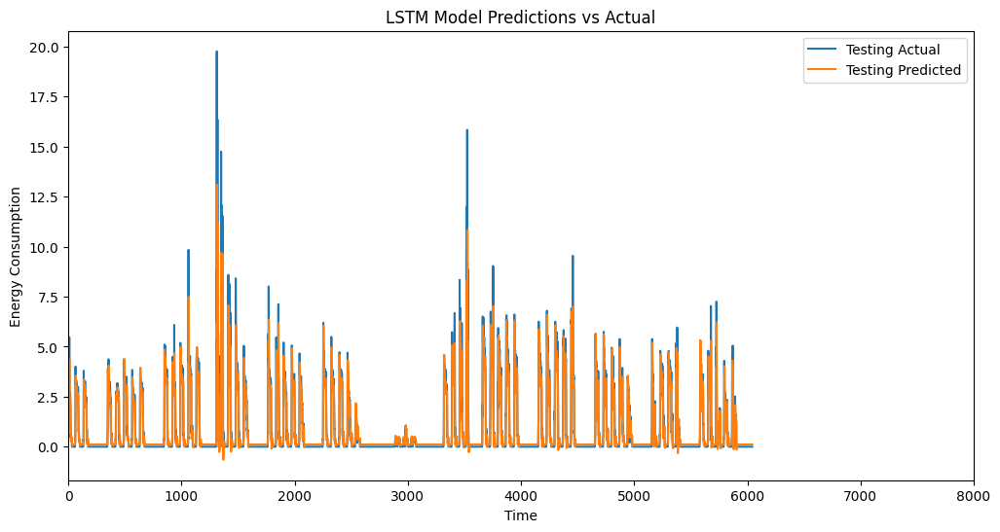

In [9]:
# LSTM

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential, save_model
from tensorflow.keras.layers import LSTM, Dense, Dropout


data_dir = 'data/'
output_dir = 'models/LSTM/'

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values

scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 352

X_lstm, y_lstm = create_dataset(X_scaled, time_step)

X_lstm = X_lstm.reshape(X_lstm.shape[0], X_lstm.shape[1], 1)

train_size = int(len(X_lstm) * 0.7)
X_train, X_test = X_lstm[:train_size], X_lstm[train_size:]
y_train, y_test = y_lstm[:train_size], y_lstm[train_size:]


lstm_model = Sequential()
lstm_model.add(LSTM(128, return_sequences=True, input_shape=(time_step, 1)))
lstm_model.add(Dropout(0.3))
lstm_model.add(LSTM(128, return_sequences=False))
lstm_model.add(Dense(1))


lstm_model.compile(optimizer='adam', loss='mean_squared_error')

lstm_model.fit(X_train, y_train, epochs=1, batch_size=8)

model_filename = 'lstm_model.h5'
save_model(lstm_model, os.path.join(output_dir, model_filename))


train_predictions = lstm_model.predict(X_train)

test_predictions = lstm_model.predict(X_test)

train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'LSTM Model Training RMSE: {train_rmse:.3f}')

test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'LSTM Model Testing RMSE: {test_rmse:.3f}')

with open(os.path.join(output_dir, 'lstm_model_performance.txt'), 'w') as f:
    f.write(f'LSTM Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'LSTM Model Testing RMSE: {test_rmse:.3f}')


# plots

import matplotlib.pyplot as plt


fig, ax = plt.subplots(figsize=(12, 6))


ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions, label='Testing Predicted')


ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('LSTM Model Predictions vs Actual')

start_index = 0
end_index = 8000

ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join("models/lstm", 'lstm_model_predictions_interval.png')) 

plt.show()

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1763/1763 ━━━━━━━━━━━━━━━━━━━━ 221s 124ms/step - loss: 5.1096e-04


441/441 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step
189/189 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step
GRU Model Training RMSE: 0.365
GRU Model Testing RMSE: 0.767


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


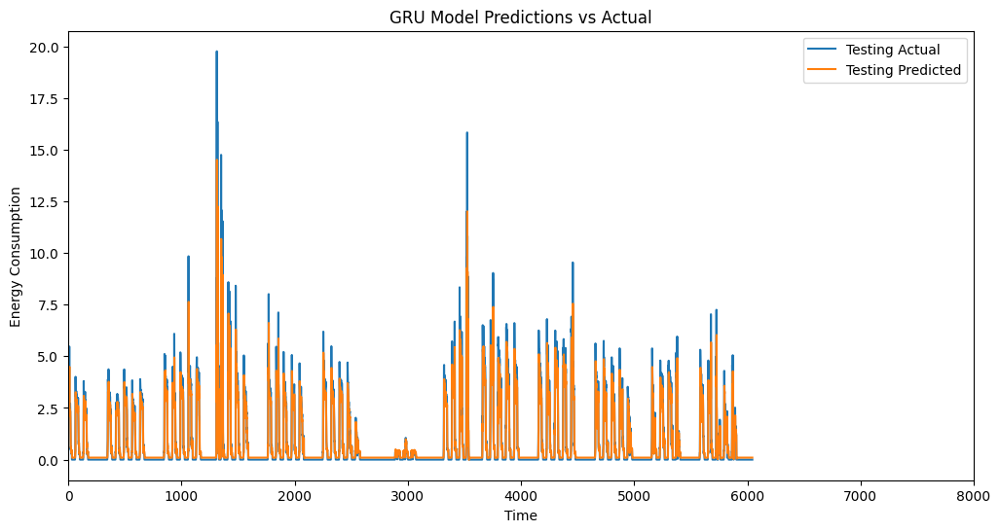

In [10]:
# GRU

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential, save_model
from tensorflow.keras.layers import GRU, Dense, Dropout


data_dir = 'data/'
output_dir = 'models/GRU/'

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values

scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 352


X_gru, y_gru = create_dataset(X_scaled, time_step)

X_gru = X_gru.reshape(X_gru.shape[0], X_gru.shape[1], 1)

train_size = int(len(X_gru) * 0.7)
X_train, X_test = X_gru[:train_size], X_gru[train_size:]
y_train, y_test = y_gru[:train_size], y_gru[train_size:]


gru_model = Sequential()
gru_model.add(GRU(128, return_sequences=True, input_shape=(time_step, 1)))
gru_model.add(Dropout(0.3))
gru_model.add(GRU(128, return_sequences=False))
gru_model.add(Dense(1))

gru_model.compile(optimizer='adam', loss='mean_squared_error')

gru_model.fit(X_train, y_train, epochs=1, batch_size=8)

model_filename = 'gru_model.h5'
save_model(gru_model, os.path.join(output_dir, model_filename))


train_predictions = gru_model.predict(X_train)

test_predictions = gru_model.predict(X_test)


train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'GRU Model Training RMSE: {train_rmse:.3f}')

test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'GRU Model Testing RMSE: {test_rmse:.3f}')

with open(os.path.join(output_dir, 'gru_model_performance.txt'), 'w') as f:
    f.write(f'GRU Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'GRU Model Testing RMSE: {test_rmse:.3f}')


# plots

import matplotlib.pyplot as plt


fig, ax = plt.subplots(figsize=(12, 6))


ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions, label='Testing Predicted')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('GRU Model Predictions vs Actual')


start_index = 0
end_index = 8000

ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join("models/GRU", 'gru_model_predictions_interval.png'))

plt.show()


MLP Model Training RMSE: 0.272
MLP Model Testing RMSE: 0.810


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


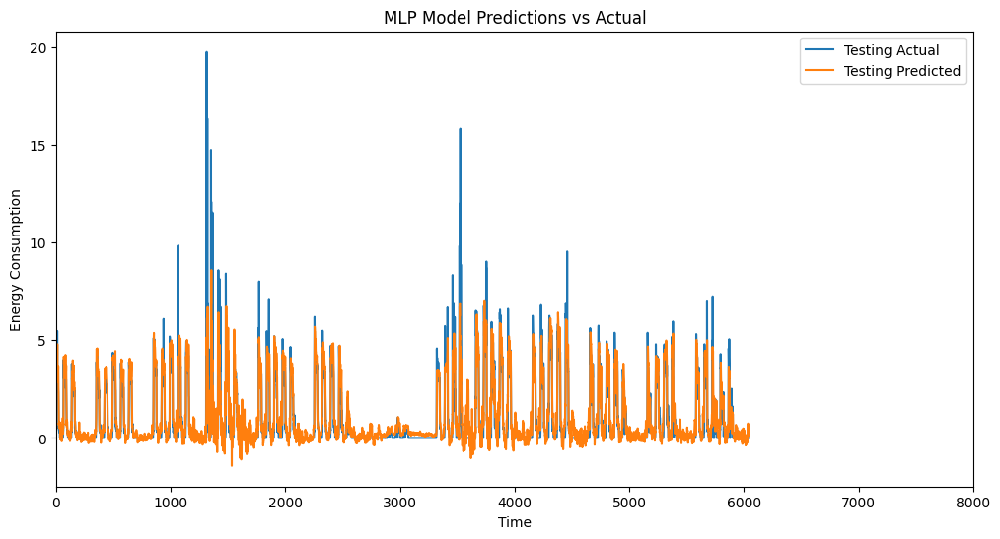

In [19]:
# MLP

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor
import pickle


data_dir = 'data/'
output_dir = 'models/MLP/' 

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values


scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 352

X_mlp, y_mlp = create_dataset(X_scaled, time_step)

X_mlp = X_mlp.reshape(X_mlp.shape[0], -1)

train_size = int(len(X_mlp) * 0.7)
X_train, X_test = X_mlp[:train_size], X_mlp[train_size:]
y_train, y_test = y_mlp[:train_size], y_mlp[train_size:]

# Build the GRNN model using MLPRegressor
mlp_model = MLPRegressor(hidden_layer_sizes=(128, 128, 128), activation='relu', solver='adam', max_iter=1000)
# Parameters explained:
# hidden_layer_sizes: Tuple indicating the number of neurons in each hidden layer.
# - Increasing the number of neurons can help capture more complex relationships but may lead to overfitting.
# activation: The activation function for the hidden layers.
# - 'relu' (Rectified Linear Unit) is commonly used as it helps with convergence and reduces the likelihood of vanishing gradients.
# solver: The algorithm to use for optimization.
# - 'adam' is a popular choice that adapts the learning rate during training.
# max_iter: The maximum number of iterations for the solver to converge.


mlp_model.fit(X_train, y_train)

model_filename = os.path.join(output_dir, 'MLP_model.pkl')
with open(model_filename, 'wb') as model_file:
    pickle.dump(mlp_model, model_file)

train_predictions = mlp_model.predict(X_train)

test_predictions = mlp_model.predict(X_test)

train_predictions = scaler.inverse_transform(train_predictions.reshape(-1, 1))
test_predictions = scaler.inverse_transform(test_predictions.reshape(-1, 1))
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'MLP Model Training RMSE: {train_rmse:.3f}')

test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'MLP Model Testing RMSE: {test_rmse:.3f}')

with open(os.path.join(output_dir, 'mlp_model_performance.txt'), 'w') as f:
    f.write(f'MLP Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'MLP Model Testing RMSE: {test_rmse:.3f}\n')

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions*1.3, label='Testing Predicted')


ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('MLP Model Predictions vs Actual')

start_index = 0
end_index = 8000


ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'mlp_model_predictions_interval.png'))

plt.show()

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Decision Tree Model Training RMSE: 0.000
Decision Tree Model Testing RMSE: 1.344


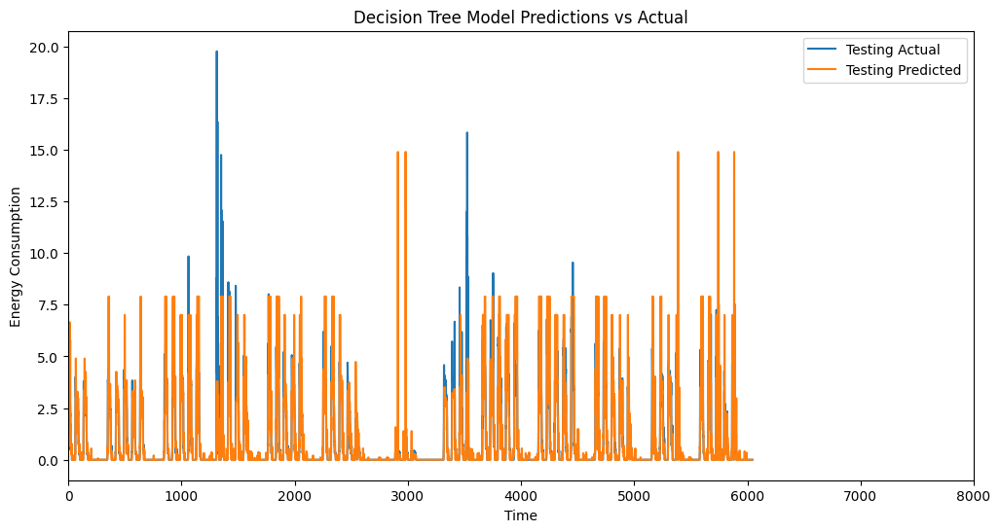

In [20]:
# Decision tree Regressor

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
import pickle


data_dir = 'data/'
output_dir = 'models/DecisionTree/'

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values


scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)


time_step = 352

X_dt, y_dt = create_dataset(X_scaled, time_step)

X_dt = X_dt.reshape(X_dt.shape[0], -1)

train_size = int(len(X_dt) * 0.7)
X_train, X_test = X_dt[:train_size], X_dt[train_size:]
y_train, y_test = y_dt[:train_size], y_dt[train_size:]

# Build the Decision Tree Regressor model
model = DecisionTreeRegressor()
# Parameters can be tuned:
# max_depth: The maximum depth of the tree. Higher values can lead to overfitting.
# min_samples_split: The minimum number of samples required to split a node.
# min_samples_leaf: The minimum number of samples required to be at a leaf node.


model.fit(X_train, y_train)

model_filename = os.path.join(output_dir, 'SVR_model.pkl')
with open(model_filename, 'wb') as model_file:
    pickle.dump(model, model_file)

train_predictions = model.predict(X_train)

test_predictions = model.predict(X_test)

train_predictions = scaler.inverse_transform(train_predictions.reshape(-1, 1))
test_predictions = scaler.inverse_transform(test_predictions.reshape(-1, 1))
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'Decision Tree Model Training RMSE: {train_rmse:.3f}')

test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'Decision Tree Model Testing RMSE: {test_rmse:.3f}')


with open(os.path.join(output_dir, 'dt_model_performance.txt'), 'w') as f:
    f.write(f'Decision Tree Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'Decision Tree Model Testing RMSE: {test_rmse:.3f}\n')


# plots


fig, ax = plt.subplots(figsize=(12, 6))


ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions, label='Testing Predicted')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('Decision Tree Model Predictions vs Actual')


start_index = 0
end_index = 8000

ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'dt_model_predictions_interval.png'))

plt.show()

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Random Forest Model Training RMSE: 0.109
Random Forest Model Testing RMSE: 0.758


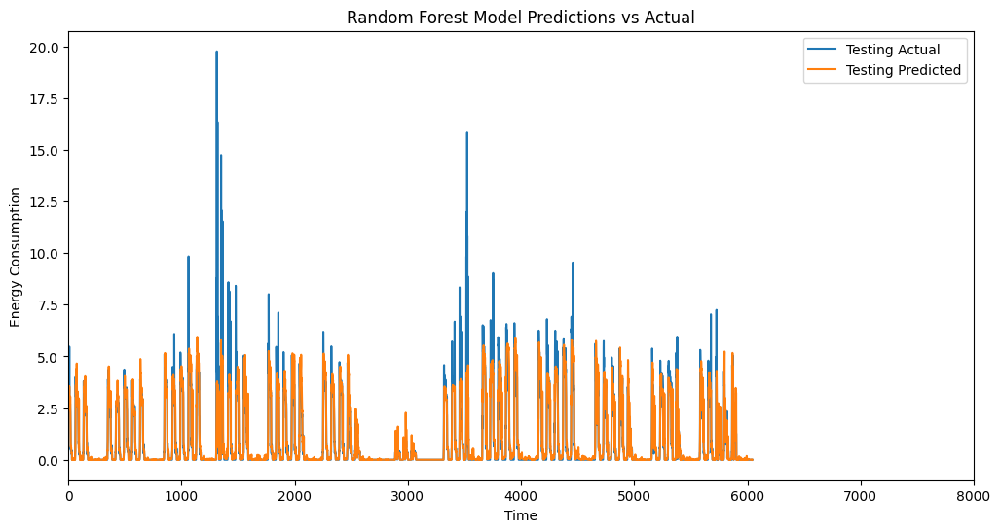

In [21]:
# Random Forest generator

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
import pickle


data_dir = 'data/'
output_dir = 'models/RandomForest/'


os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values


scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)


time_step = 352  


X_rf, y_rf = create_dataset(X_scaled, time_step)

X_rf = X_rf.reshape(X_rf.shape[0], -1)  

train_size = int(len(X_rf) * 0.7)
X_train, X_test = X_rf[:train_size], X_rf[train_size:]
y_train, y_test = y_rf[:train_size], y_rf[train_size:]

# Build the Random Forest Regressor model
model = RandomForestRegressor()
# Parameters can be tuned:
# n_estimators: The number of trees in the forest.
# max_depth: The maximum depth of the trees.
# min_samples_split: The minimum number of samples required to split a node.
# min_samples_leaf: The minimum number of samples required to be at a leaf node.


model.fit(X_train, y_train)

model_filename = os.path.join(output_dir, 'RF_model.pkl')
with open(model_filename, 'wb') as model_file:
    pickle.dump(model, model_file)

train_predictions = model.predict(X_train)

test_predictions = model.predict(X_test)

train_predictions = scaler.inverse_transform(train_predictions.reshape(-1, 1))
test_predictions = scaler.inverse_transform(test_predictions.reshape(-1, 1))
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

train_rmse = mean_squared_error(y_train_actual, train_predictions, squared=False)
print(f'Random Forest Model Training RMSE: {train_rmse:.3f}')

test_rmse = mean_squared_error(y_test_actual, test_predictions, squared=False)
print(f'Random Forest Model Testing RMSE: {test_rmse:.3f}')

with open(os.path.join(output_dir, 'rf_model_performance.txt'), 'w') as f:
    f.write(f'Random Forest Model Training RMSE: {train_rmse:.3f}\n')
    f.write(f'Random Forest Model Testing RMSE: {test_rmse:.3f}\n')


# plots


fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual')

ax.plot(test_predictions, label='Testing Predicted')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('Random Forest Model Predictions vs Actual')

start_index = 0 
end_index = 8000

ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'rf_model_predictions_interval.png'))

plt.show()


### Hybrid models



378/378 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step
378/378 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squa

Optimal weight for LSTM: 0.55
Optimal weight for GRU: 0.50
Optimal bias: -0.05
Best RMSE: 0.336
  1/252 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step

c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


252/252 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step
252/252 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step
Weighted Average Model RMSE: 0.677


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


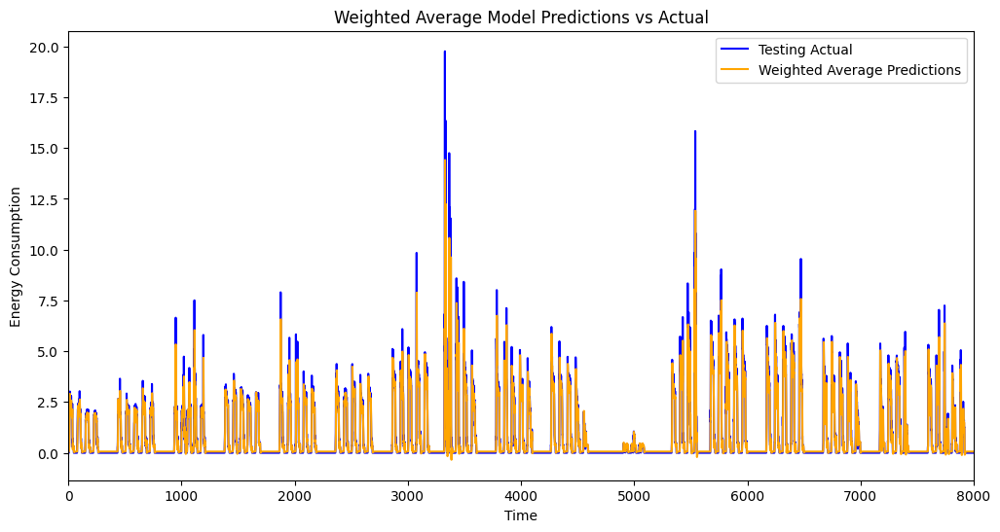

In [16]:
# LSTM and GRU

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt4
import time


data_dir = 'data/'
lstm_model_path = 'models/LSTM/lstm_model.h5'
gru_model_path = 'models/GRU/gru_model.h5'
output_dir = 'models/GRUxLSTM/'


lstm_model = load_model(lstm_model_path)
gru_model = load_model(gru_model_path)

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values

scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 352

X_data, y_data = create_dataset(X_scaled, time_step)

X_data = X_data.reshape(X_data.shape[0], X_data.shape[1], 1)

train_size = int(len(X_data) * 0.6)
X_train, X_test = X_data[:train_size], X_data[train_size:]
y_train, y_test = y_data[:train_size], y_data[train_size:]

lstm_predictions = lstm_model.predict(X_train)
gru_predictions = gru_model.predict(X_train)

lstm_predictions = scaler.inverse_transform(lstm_predictions)
gru_predictions = scaler.inverse_transform(gru_predictions)
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

def calculate_rmse(lstm_weight, gru_weight, bias):
    weighted_predictions = lstm_weight * lstm_predictions + gru_weight * gru_predictions + bias
    return mean_squared_error(y_train_actual, weighted_predictions, squared=False)

best_lstm_weight = 0
best_gru_weight = 0
best_bias = 0
best_rmse = float('inf')

for lstm_weight in np.arange(0, 1.5, 0.05):
    for gru_weight in np.arange(0, 1.5, 0.05):
        for bias in np.arange(-1.0, 0.1, 0.05):
            rmse = calculate_rmse(lstm_weight, gru_weight, bias)
            time.sleep(0.050)
            if rmse < best_rmse:
                best_rmse = rmse
                best_lstm_weight = lstm_weight
                best_gru_weight = gru_weight
                best_bias = bias

print(f'Optimal weight for LSTM: {best_lstm_weight:.2f}')
print(f'Optimal weight for GRU: {best_gru_weight:.2f}')
print(f'Optimal bias: {best_bias:.2f}')
print(f'Best RMSE: {best_rmse:.3f}')

lstm_predictions = lstm_model.predict(X_test)
gru_predictions = gru_model.predict(X_test)
lstm_predictions = scaler.inverse_transform(lstm_predictions)
gru_predictions = scaler.inverse_transform(gru_predictions)
final_predictions =  lstm_predictions * best_lstm_weight + gru_predictions * best_gru_weight + best_bias


final_rmse = mean_squared_error(y_test_actual, final_predictions, squared=False)
print(f'Weighted Average Model RMSE: {final_rmse:.3f}')


# plots


fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual', color='blue')

ax.plot(final_predictions, label='Weighted Average Predictions', color='orange')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('Weighted Average Model Predictions vs Actual')

start_index = 0
end_index = 8000
ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'weighted_average_model_predictions.png'))

plt.show()


441/441 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squa

Optimal weight for MLP: 1.05
Optimal weight for GRU: 0.00
Optimal Bias: 0.00
Best RMSE: 0.270
189/189 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step
Weighted Average Model RMSE: 0.790


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


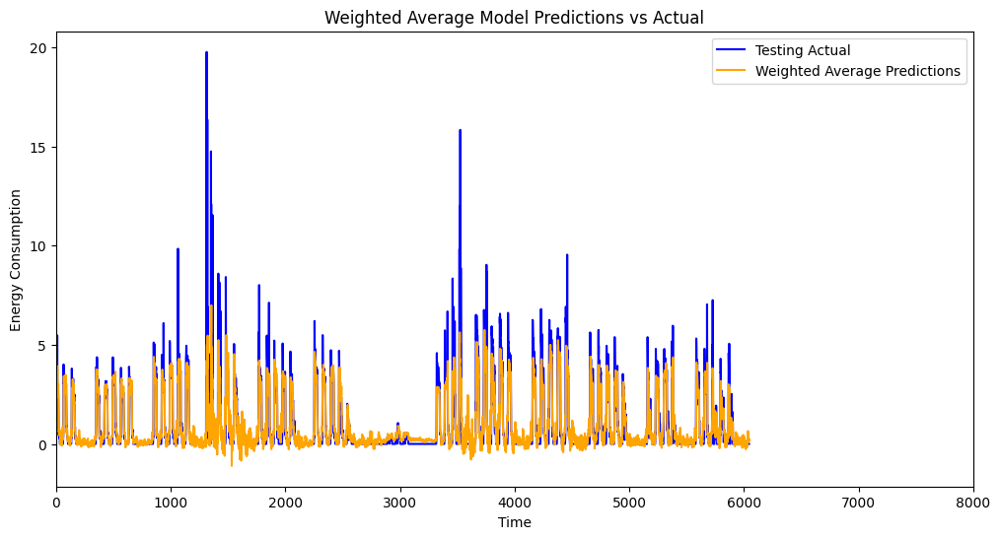

In [22]:
# MLP and GRU

import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import pickle
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import time


data_dir = 'data/'
mlp_model_path = 'models/MLP/MLP_model.pkl'
gru_model_path = 'models/GRU/gru_model.h5'
output_dir = 'models/GRUxMLP/'


with open(mlp_model_path, 'rb') as file:
    mlp_model = pickle.load(file)
gru_model = load_model(gru_model_path)

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values

scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))

def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)

time_step = 352

X_data, y_data = create_dataset(X_scaled, time_step)

X_data_gru = X_data.reshape(X_data.shape[0], X_data.shape[1], 1)

train_size = int(len(X_data) * 0.7)
X_train_mlp, X_test_mlp = X_data[:train_size], X_data[train_size:]
y_train, y_test = y_data[:train_size], y_data[train_size:]


mlp_predictions = mlp_model.predict(X_train_mlp)
gru_predictions = gru_model.predict(X_train_mlp.reshape(X_train_mlp.shape[0], time_step, 1))

mlp_predictions = scaler.inverse_transform(mlp_predictions.reshape(-1, 1))  # Reshape to 2D
gru_predictions = scaler.inverse_transform(gru_predictions)
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))

def calculate_rmse(mlp_weight, gru_weight, bias):
    weighted_predictions = mlp_weight * mlp_predictions + gru_weight * gru_predictions + bias
    return mean_squared_error(y_train_actual, weighted_predictions, squared=False)

best_mlp_weight = 0
best_gru_weight = 0
best_bias = 0
best_rmse = float('inf')

for mlp_weight in np.arange(0, 1.5, 0.05):
    for gru_weight in np.arange(0, 1.5, 0.05):
        for bias in np.arange(-1.0, 0.1, 0.05):
            rmse = calculate_rmse(mlp_weight, gru_weight, bias)
            time.sleep(0.050)
            if rmse < best_rmse:
                best_rmse = rmse
                best_mlp_weight = mlp_weight
                best_gru_weight = gru_weight
                best_bias = bias

print(f'Optimal weight for MLP: {best_mlp_weight:.2f}')
print(f'Optimal weight for GRU: {best_gru_weight:.2f}')
print(f'Optimal Bias: {best_bias:.2f}')
print(f'Best RMSE: {best_rmse:.3f}')

mlp_predictions = mlp_model.predict(X_test_mlp)
gru_predictions = gru_model.predict(X_test_mlp.reshape(X_test_mlp.shape[0], time_step, 1))
mlp_predictions = scaler.inverse_transform(mlp_predictions.reshape(-1, 1))  # Reshape to 2D
gru_predictions = scaler.inverse_transform(gru_predictions)
final_predictions = mlp_predictions * best_mlp_weight + gru_predictions * best_gru_weight + bias

y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))  # Inverse transform y_test
final_rmse = mean_squared_error(y_test_actual, final_predictions, squared=False)
print(f'Weighted Average Model RMSE: {final_rmse:.3f}')


# plots


fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual', color='blue')

ax.plot(final_predictions, label='Weighted Average Predictions', color='orange')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('Weighted Average Model Predictions vs Actual')

start_index = 0
end_index = 8000
ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'weighted_average_model_predictions.png'))

plt.show()

378/378 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squa

Optimal weight for MLP: 0.90
Optimal weight for LSTM: 0.10
Optimal Bias: 0.00
Best RMSE: 0.269
252/252 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step
Weighted Average Model RMSE: 0.633


c:\Users\raul\anaconda3\envs\HBI_datalake_management\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


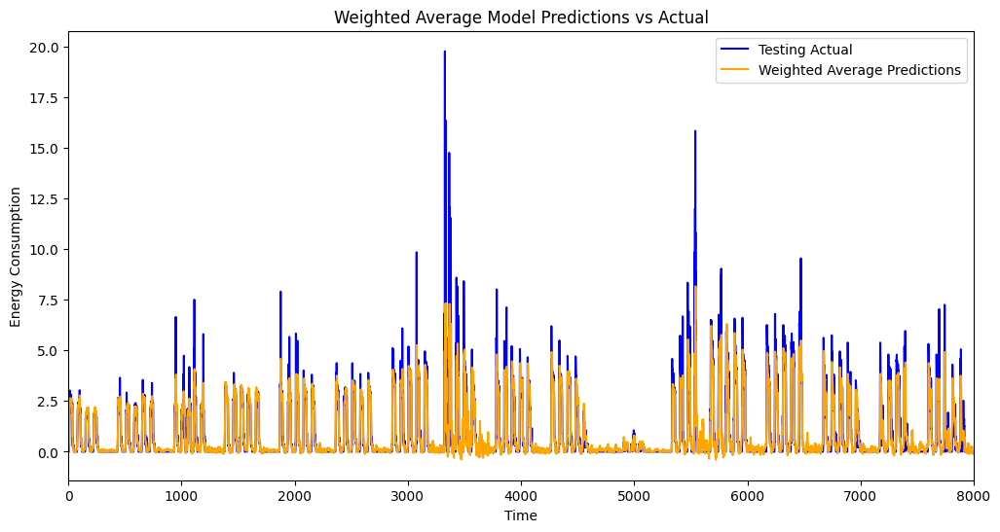

In [ ]:
# LSTM and MLP


import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import pickle
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import time


data_dir = 'data/'
mlp_model_path = 'models/MLP/MLP_model.pkl'
lstm_model_path = 'models/LSTM/lstm_model.h5'
output_dir = 'models/MLPxLSTM/'


with open(mlp_model_path, 'rb') as file:
    mlp_model = pickle.load(file)
lstm_model = load_model(lstm_model_path)

os.makedirs(output_dir, exist_ok=True)

dfs = []
for filename in os.listdir(data_dir):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(data_dir, filename))
        dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)
X = combined_df['energy_consumption_diff'].values

scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X.reshape(-1, 1))


def create_dataset(data, time_step=1):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        y.append(data[i + time_step, 0])
    return np.array(X), np.array(y)


time_step = 352

X_data, y_data = create_dataset(X_scaled, time_step)

X_data_lstm = X_data.reshape(X_data.shape[0], X_data.shape[1], 1)

train_size = int(len(X_data) * 0.6)
X_train_mlp, X_test_mlp = X_data[:train_size], X_data[train_size:]
y_train, y_test = y_data[:train_size], y_data[train_size:]

mlp_predictions = mlp_model.predict(X_train_mlp)
lstm_predictions = lstm_model.predict(X_train_mlp.reshape(X_train_mlp.shape[0], time_step, 1))

mlp_predictions = scaler.inverse_transform(mlp_predictions.reshape(-1, 1))
lstm_predictions = scaler.inverse_transform(lstm_predictions)
y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))

def calculate_rmse(mlp_weight, lstm_weight, bias):
    weighted_predictions = mlp_weight * mlp_predictions + lstm_weight * lstm_predictions + bias
    return mean_squared_error(y_train_actual, weighted_predictions, squared=False)

best_mlp_weight = 0
best_lstm_weight = 0
best_bias = 0
best_rmse = float('inf')


for mlp_weight in np.arange(0, 1.5, 0.05):
    for lstm_weight in np.arange(0, 1.5, 0.05):
        for bias in np.arange(-1.0, 0.1, 0.05):
            rmse = calculate_rmse(mlp_weight, lstm_weight, bias)
            time.sleep(0.050)
            if rmse < best_rmse:
                best_rmse = rmse
                best_mlp_weight = mlp_weight
                best_lstm_weight = lstm_weight
                best_bias = bias

print(f'Optimal weight for MLP: {best_mlp_weight:.2f}')
print(f'Optimal weight for LSTM: {best_lstm_weight:.2f}')
print(f'Optimal Bias: {best_bias:.2f}')
print(f'Best RMSE: {best_rmse:.3f}')

mlp_predictions = mlp_model.predict(X_test_mlp)
lstm_predictions = lstm_model.predict(X_test_mlp.reshape(X_test_mlp.shape[0], time_step, 1))
mlp_predictions = scaler.inverse_transform(mlp_predictions.reshape(-1, 1))
lstm_predictions = scaler.inverse_transform(lstm_predictions)
final_predictions = mlp_predictions * best_mlp_weight + lstm_predictions * best_lstm_weight + bias


y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
final_rmse = mean_squared_error(y_test_actual, final_predictions, squared=False)
print(f'Weighted Average Model RMSE: {final_rmse:.3f}')

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(y_test_actual, label='Testing Actual', color='blue')

ax.plot(final_predictions, label='Weighted Average Predictions', color='orange')

ax.set_xlabel('Time')
ax.set_ylabel('Energy Consumption')
ax.set_title('Weighted Average Model Predictions vs Actual')


start_index = 0
end_index = 8000
ax.set_xlim(start_index, end_index)

ax.legend()

plt.savefig(os.path.join(output_dir, 'weighted_average_model_predictions.png'))

plt.show()
